<a href="https://colab.research.google.com/github/USAFADFCS/cs471-pex-5-fall-2021-counting-cards/blob/main/PEX_5_Student_Version.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Partner 1: Frank Rossi
### Parnter 2: Matthew LaRosa

### Documentation Statement: The group received help from Lt. Col. Maher when the bounding boxes were not aligning after augmentations. We also used online resource to try different training methods including Adaptive Moment Estimation

#PEX 5 YOLO!
## 80 Points

In PEX 5 you will train the YOLO object detection algorihtm to detect objects that interest you. If you are not feeling creative, you can collect data and train a model to detect playing card suits and face values. You will then do something interesting with your model. For example, with the playing card data set, you can use the web cam to play blackjack without user input. 

The graded objectives for PEX 5 are:

(10 pts) Collect and label data for use in building a custom YOLO model

(20 pts) Train the YOLO model to high accuracy for your domain

  **"Lt Col Maher, what is high accuracy?" ... It depends on your domain. If you want to make sure you recieve full credit, write down all of your efforts to improve the accuracy of the model, and write a statement why you think you have achieved peak accuracy in this model. Charts and graphs will help to justify your stance. 

(10 pts) Use data analysis to interpret the Mean Average Precision, accuracy and recall of your model

(20 pts) Enable object detection through a web camera

(20 pts) Write code that does something interesting with your model. 

(10 pts) Write a 300-500 word essay describing the possible ethical implications of your project. Reference an ethical framework to justify your view. 


**AUTHORIZED RESOURCES:** Any material from the CS 471 course site and online resources. You may reuse online code as long as you describe what the code is doing in your comments and you modify it to solve this problem. Don't forget to document any online code sources. 

**NOTE:**

*  Never copy another person’s or group’s work and submit it as your own.
*  Do not jointly create a program or complete this assignment unless explicitly allowed.
*   You must document all help received from sources other than your instructor or instructor-provided course materials (including your textbook).

**Documentation Policy:**

*   You must document all help received from any source other than your instructor or instructor-provided materials, including your textbook (unless directly quoting or paraphrasing).
*   The documentation statement must explicitly describe WHAT assistance was provided, WHERE on the assignment the assistance was provided, and WHO provided the assistance, and HOW it was used in completing the assignment.
*   If no help was received on this assignment, the documentation statement must state “None.”
*   If you checked answers with anyone, you must document with whom on which problems. You must document whether or not you made any changes, and if you did make changes you must document the problems you changed and the reasons why.
*   Vague documentation statements must be corrected before the assignment will be graded and will result in a 5% deduction on the assignment.

**Turn-in Policies:**

*   On-time turn-in is at the specific day and time listed above.
*   Post the required solution files to your Github Classroom repo.
*   Only 1 turn-in required per team.






## (10 pts) Task 1 Train and Label data for use in building a custom YOLO model. 
For task 1, the team created a roboflow account, took picture of cards, and labeled them. Then, augmentations were applied to the data set to create more images. The roboflow page can be found at https://app.roboflow.com/ds/MN4C2wV5Qx?key=00uQIb35SA

## (20 pts) Task 2 Train a Yolo model to high accuracy. 

Keep a log of your experimentation with improving your model. 

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 10152, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 10152 (delta 0), reused 3 (delta 0), pack-reused 10148
Receiving objects: 100% (10152/10152), 10.45 MiB | 16.64 MiB/s, done.
Resolving deltas: 100% (7029/7029), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 7.8 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [ ]:
%cd /content/yolov5
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="w7aE5Zah7JZ4Rtnl7ndK")
project = rf.workspace().project("pex5v3")
dataset = project.version(2).download("yolov5")

/content/yolov5
     |████████████████████████████████| 145 kB 8.7 MB/s 
     |████████████████████████████████| 178 kB 51.8 MB/s 
     |████████████████████████████████| 1.1 MB 50.4 MB/s 
     |████████████████████████████████| 67 kB 7.8 MB/s 
     |████████████████████████████████| 138 kB 79.7 MB/s 
     |████████████████████████████████| 62 kB 958 kB/s 
  Created wheel for roboflow: filename=roboflow-0.2.1-py3-none-any.whl size=20914 sha256=ab03f4f794f36a8c9e32bb2aa077106a0ba05692a18ad6a2973b4c08fde9354e
  Stored in directory: /root/.cache/pip/wheels/57/00/03/2d83f3e90ff41c36eef9c3747c328290c01b06e2619f9ed7b6
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=239699c8d6d5605e337aac9dae3d663c412d9c58f9a199cc67ee591f63ed62f6
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling 

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Pex5v3-2 in yolov5pytorch:: 100%|██████████| 414/414 [00:00<00:00, 1052.02it/s]


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat /content/yolov5/Pex5v3-1/data.yaml
#dataset.location = '/content/yolov5'

cat: /content/yolov5/Pex5v3-1/data.yaml: No such file or directory


In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
!python train.py --help

usage: train.py [-h] [--weights WEIGHTS] [--cfg CFG] [--data DATA] [--hyp HYP]
                [--epochs EPOCHS] [--batch-size BATCH_SIZE]
                [--img-size IMG_SIZE [IMG_SIZE ...]] [--rect]
                [--resume [RESUME]] [--nosave] [--notest] [--noautoanchor]
                [--evolve] [--bucket BUCKET] [--cache-images]
                [--image-weights] [--device DEVICE] [--multi-scale]
                [--single-cls] [--adam] [--sync-bn] [--local_rank LOCAL_RANK]
                [--log-imgs LOG_IMGS] [--log-artifacts] [--workers WORKERS]
                [--project PROJECT] [--entity ENTITY] [--name NAME]
                [--exist-ok] [--quad] [--linear-lr]

optional arguments:
  -h, --help            show this help message and exit
  --weights WEIGHTS     initial weights path
  --cfg CFG             model.yaml path
  --data DATA           data.yaml path
  --hyp HYP             hyperparameters path
  --epochs EPOCHS
  --batch-size BATCH_SIZE
                        total 

In [ ]:
# train yolov5s on custom data for 1000 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 3000 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights ' ' --name yolov5s_results  --cache --exist-ok

Streaming output truncated to the last 5000 lines.
                 all           8         271       0.556       0.296       0.312       0.157

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
 2005/2999     1.39G   0.04288   0.06937  0.008737     0.121       901       416: 100% 12/12 [00:01<00:00,  6.61it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 1/1 [00:00<00:00,  9.57it/s]
                 all           8         271       0.552       0.292       0.313       0.157

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
 2006/2999     1.39G   0.03959   0.06134   0.00841    0.1093       758       416: 100% 12/12 [00:01<00:00,  6.62it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 1/1 [00:00<00:00, 10.06it/s]
                 all           8         271       0.553       0.286       0.309       0.157

     Epoch   

## Experimentation Log

The first attempt at running this model resulted in an mAP @ 0.5 of 0.06 after 3000 iterations. After looking at some examples of yolo online, we realized that all the data in the model must be annotated in order to increase efficiency. For example, when annotating the 5 of hearts, all of the hearts must be identified, not just the two hearts under the numeral 5.

After relabeling all the data, we added rotation and noise augmentation as well. This was an attempt to make our training data more resilient and broadly applicable by creating more training data based off of existing images. We included a class for cards, a class for each suit, and a class for each number or letter on the card.

After running the new training data, we noticed that training times were high and so we found a new method called Adaptive Moment Estimation that adjusts the learning rate to a rate proportional to the error. We found this method trained quicker than Stochastic Gradient Descent. We ran Adam for 3000 epochs and then to fine tune the model we ran SGD.

Unfortunately even with this number of epochs we still saw poor performance on the number/letter classes and only decent performance on the suits. Notably in all our runs the Spades class never achieved an acceptable level of precision. This may be due to limitations with our test data.

We tried experimenting with different data augmentations with little effect. Our final run was 3000 epochs on the data with data augmentations productin 9x the original data and with SGD instead of Adam to ensure maximum precision. After 3000 epochs our mAP had long since leveled out so we decided to leave it there. Our final mAP @ 0.5 for the card class ended at 0.918. If we wanted to improve this model further we would likely need to improve/enlarge the set of training data. 

The image below shows the class balances of our raw data containing 39 images. This is from the Roboflow Dataset Health Check
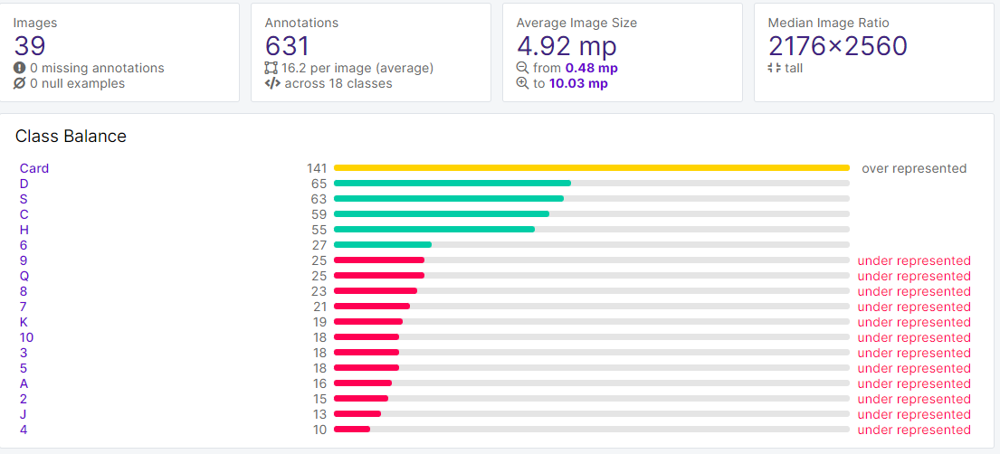



## (20 pts) Task 3 Justify how well your model performs
Provide charts showing at least the Mean Average Precision, Accuracy, and Recall of your model. Discuss the charts and what these results mean. You may want to include a discussion on overfitting and underfitting in your discussion. 

###Answer to Task 3. 
The dataset shows a limited number of card numbers (2-A) and a wide variety of suits (D,H,C, and S). The largest number of classes is the card as a whole. This aligns with our model as it classifies the cards with 88.6 percent accuracy. Then it identifies the suits with 0.7 to 84 percent accuracy. It is unclear why the model is deficient at identifying spades (0.007 accuracy) when other suits perform relatively well.

After analyzing the charts, the appears to support our beliefs that the model performs relatively well for certain features. One metric to determine how well the model performs is to review the Precision vs Recall chart. A perfect classifier would have our features plot a perfect square. Although the combination of all the classes is far from rectangular, the heart and card classes are much closer.

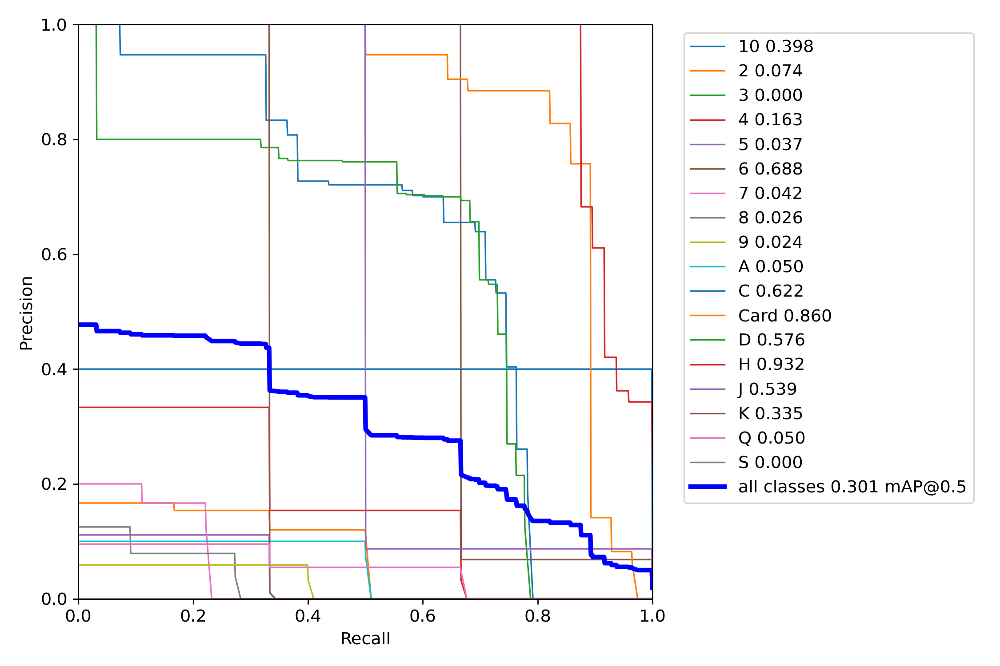

Additionally, the mAP of the model flattens out as seen on the tensor flow board. This shows the model is approaching peak accuracy as the model is not obtaining any significant increases to the accuracy of the model.

The F1 vs Confidence curve helps identify the appropriate confidence interval for each feature. The intent is to pick the confidence value to maximize the F1 curve. For the cards class, this value should be approximately 0.7. Once all the suits are included, a proper confidence value should be around 0.6.

Finally, our long training times could create a situation where the model is overfitted to the current data but looking at the graphs in the tensorboard and how they are starting to level off makes us believe that we are not yet at that point.



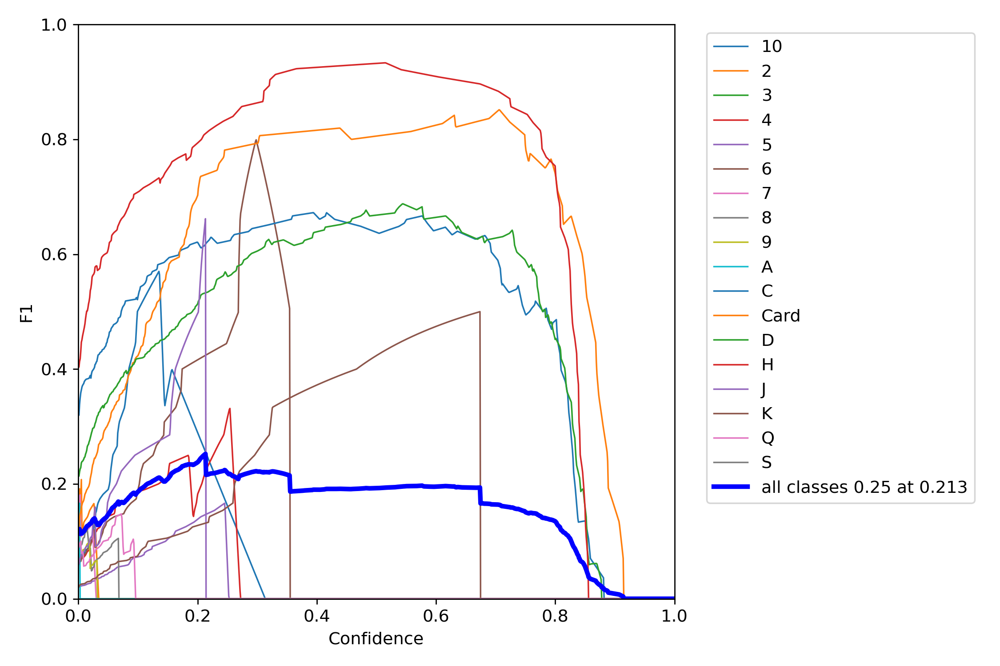

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 270), started 2:01:49 ago. (Use '!kill 270' to kill it.)

<IPython.core.display.Javascript object>

In [26]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.6 --source Pex5v3-2/test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.6, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='Pex5v3-2/test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7292367 parameters, 0 gradients, 16.9 GFLOPS
image 1/4 /content/yolov5/Pex5v3-2/test/images/IMG_20211201_103059_jpg.rf.e8c43006d403fd36b108f516490d3147.jpg: 416x416 1 Card, 11 Hs, Done. (0.009s)
image 2/4 /

GROUND TRUTH TRAINING DATA:


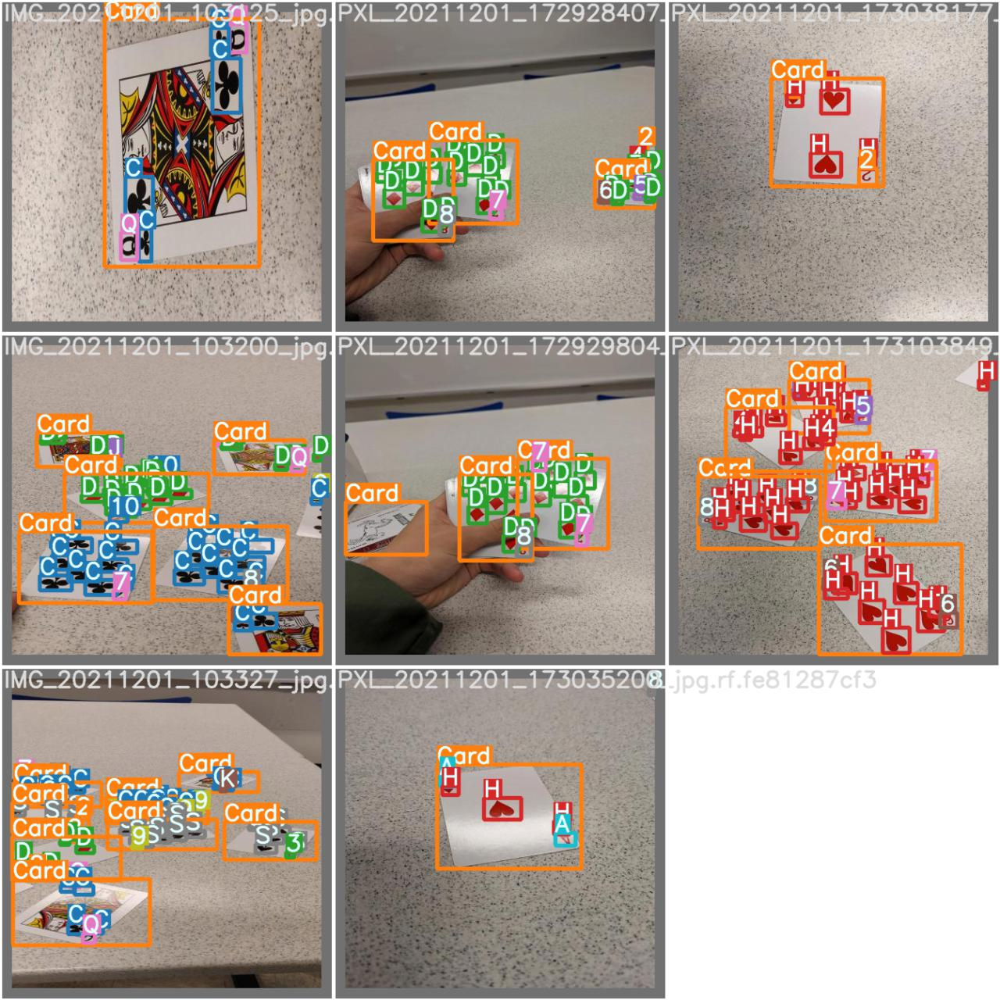

In [15]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


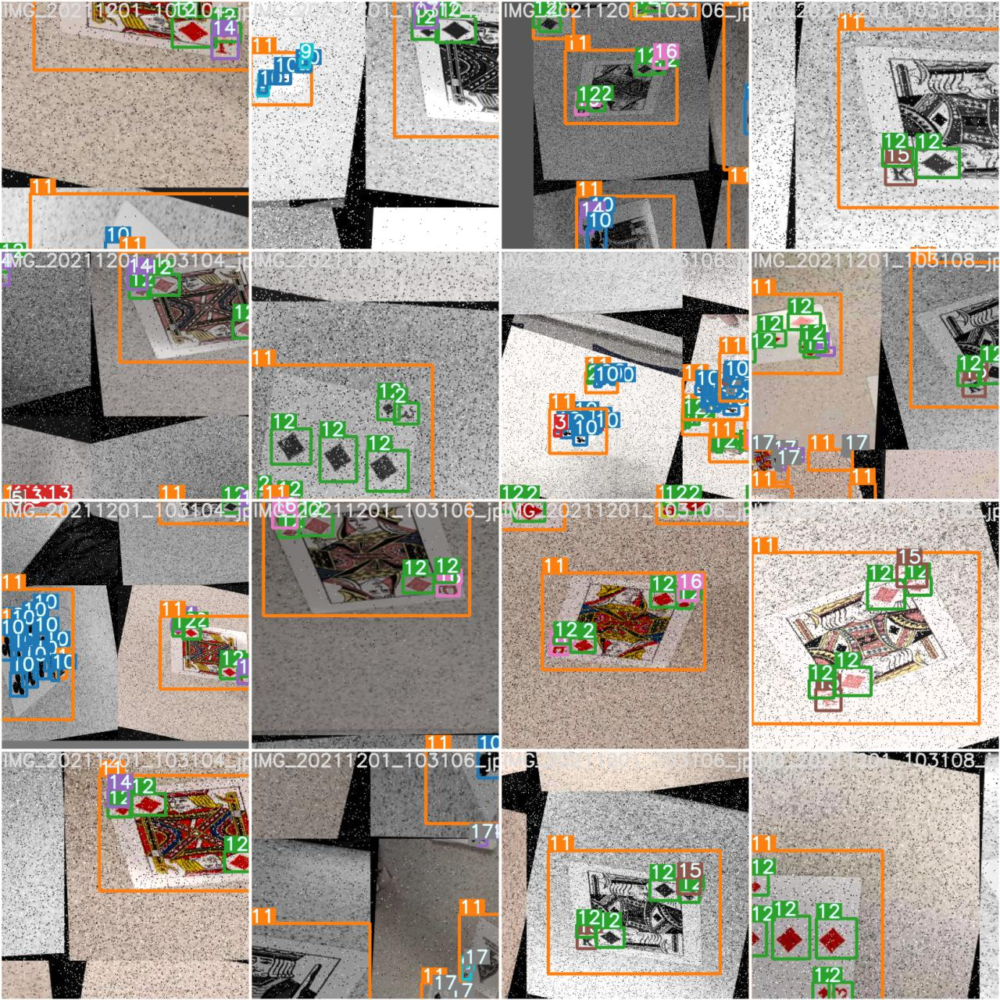

In [16]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

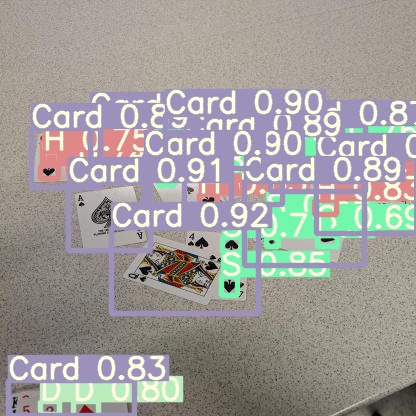

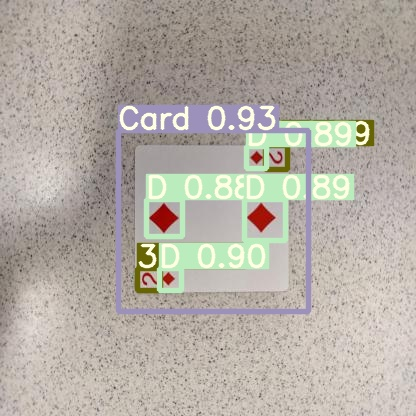

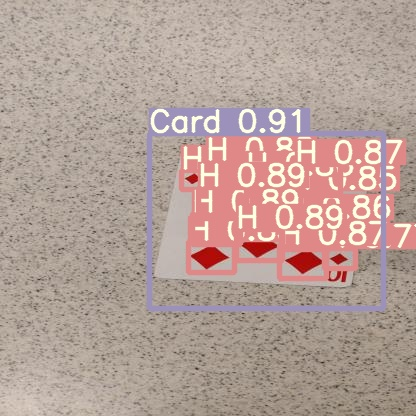

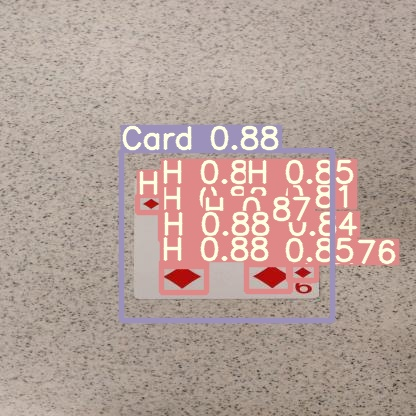

In [27]:
#display inference on ALL test images MAKE SURE YOU CHANGE THE FOLDER NAME
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

##(20 pts) Task 4. Connect your model to Webcam streaming

Enable your model to predict in real-time on a web camera, using your custom model. If the objects you train your model to are not something commonly available, please provide the web cam code and a pre-recorded video of you detecting the object. 

Hint: On the left hand side, Google Colab gives you code for accessing your webcam with Javascript. Use this code to get your webcam working. YOLO has a webcam input functionality built-in, but you cannot use this functionality, because it is attempting to open the webcam on Google's server and not your laptop. To execute this step

1.   Modify the webcam code so that it will open the webcam,
2.   take a picture,
1.   close the webcam,
2.   run the detection algorithm,
1.   display the detection image
2.   and then repeat 5 times.

This will not be the same as real-time webcam footage, but it will get you as close as you can get on Google Colab. 


In [18]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

mkdir: cannot create directory ‘new_images’: File exists
/content/yolov5/new_images


<IPython.core.display.Javascript object>

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', exist_ok=True, img_size=416, iou_thres=0.45, name='webcam', project='runs/detect', save_conf=False, save_txt=True, source='/content/yolov5/new_images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7292367 parameters, 0 gradients, 16.9 GFLOPS
image 1/1 /content/yolov5/new_images/photo.jpg: 320x416 1 10, 1 2, 1 7, 1 8, 12 Cs, 2 Cards, 1 D, Done. (0.011s)
Results saved to runs/detect/webcam
1 lab

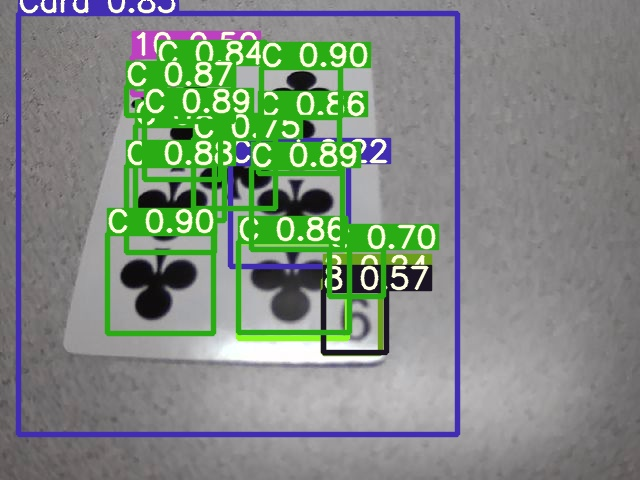

/content/yolov5/new_images


<IPython.core.display.Javascript object>

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', exist_ok=True, img_size=416, iou_thres=0.45, name='webcam', project='runs/detect', save_conf=False, save_txt=True, source='/content/yolov5/new_images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7292367 parameters, 0 gradients, 16.9 GFLOPS
image 1/1 /content/yolov5/new_images/photo.jpg: 320x416 1 10, 13 Cs, 1 Card, Done. (0.013s)
Results saved to runs/detect/webcam
1 labels saved to runs/det

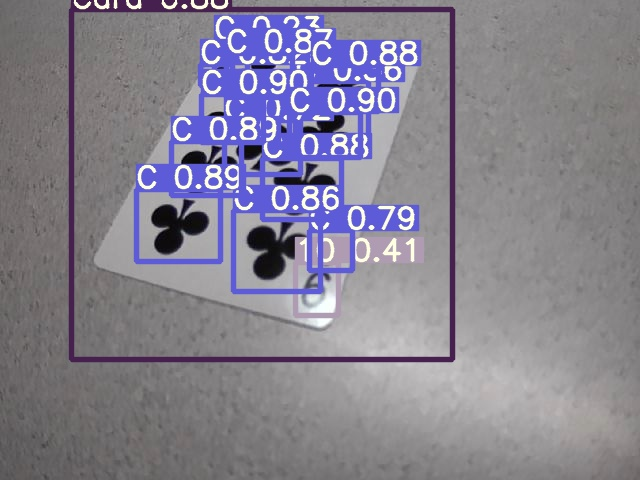

/content/yolov5/new_images


<IPython.core.display.Javascript object>

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', exist_ok=True, img_size=416, iou_thres=0.45, name='webcam', project='runs/detect', save_conf=False, save_txt=True, source='/content/yolov5/new_images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7292367 parameters, 0 gradients, 16.9 GFLOPS
image 1/1 /content/yolov5/new_images/photo.jpg: 320x416 1 10, 2 2s, 1 7, 1 8, 13 Cs, 1 Card, Done. (0.011s)
Results saved to runs/detect/webcam
1 labels s

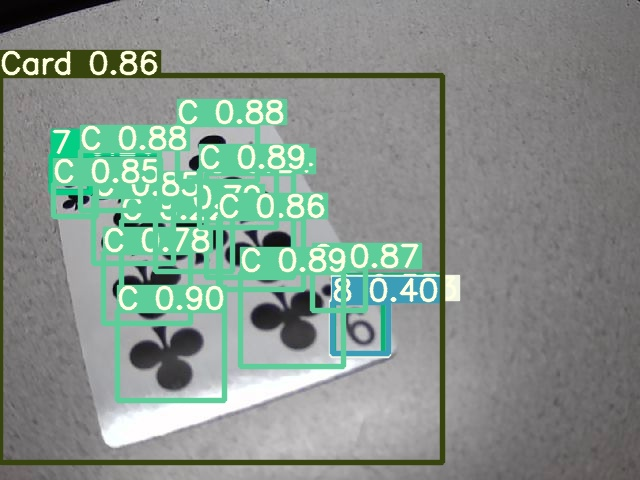

/content/yolov5/new_images


<IPython.core.display.Javascript object>

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', exist_ok=True, img_size=416, iou_thres=0.45, name='webcam', project='runs/detect', save_conf=False, save_txt=True, source='/content/yolov5/new_images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7292367 parameters, 0 gradients, 16.9 GFLOPS
image 1/1 /content/yolov5/new_images/photo.jpg: 320x416 1 10, 2 2s, 1 7, 8 Cs, 2 Cards, 4 Hs, 3 Ss, Done. (0.011s)
Results saved to runs/detect/webcam
1 l

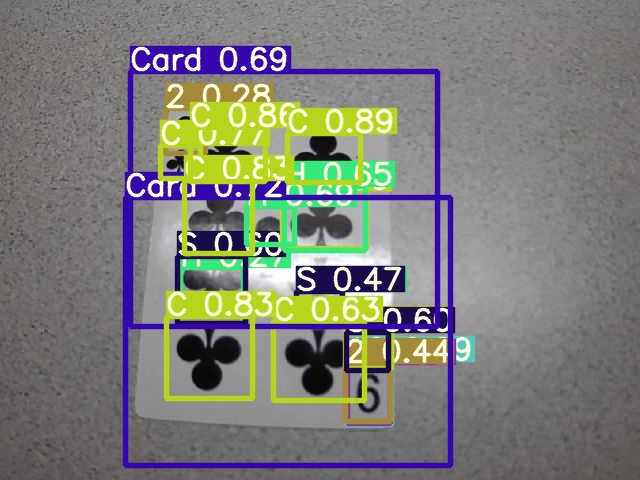

/content/yolov5/new_images


<IPython.core.display.Javascript object>

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', exist_ok=True, img_size=416, iou_thres=0.45, name='webcam', project='runs/detect', save_conf=False, save_txt=True, source='/content/yolov5/new_images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7292367 parameters, 0 gradients, 16.9 GFLOPS
image 1/1 /content/yolov5/new_images/photo.jpg: 320x416 1 8, 12 Cs, 1 Card, Done. (0.011s)
Results saved to runs/detect/webcam
1 labels saved to runs/dete

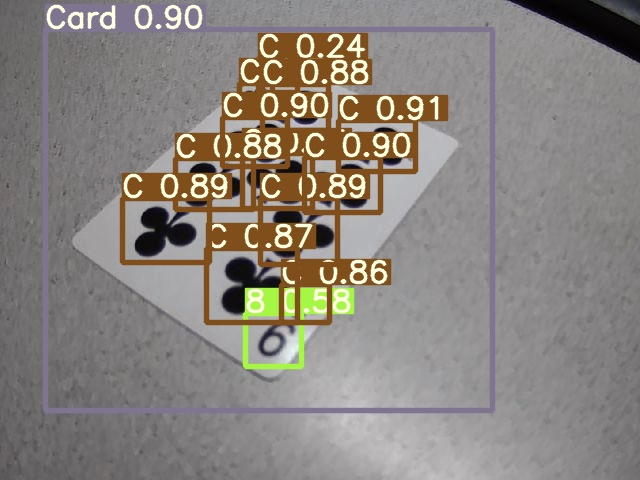

In [33]:
!mkdir new_images

for i in range(5):
  %cd /content/yolov5/new_images
  photo=take_photo()
  %cd /content/yolov5/
  !python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.2 --source /content/yolov5/new_images --name webcam --exist-ok --save-txt
  display(Image(filename='/content/yolov5/runs/detect/webcam/photo.jpg'))





###Answer to Task 4
Notably the glare from the light seems to cause a bit of a problem in the detection.

##(10 pts) Task 5. Create something interesting using your model

You have a limited time, so don't make this a huge feature, just something cool your model could do. For example, something that counts the objects coming across the webcam would receive full points. If you have a more creative idea, I may be inclined to add some bonus points, but make sure you are taking care of your other classwork as well. 

/content/yolov5
mkdir: cannot create directory ‘finalPhoto’: File exists
/content/yolov5/finalPhoto


<IPython.core.display.Javascript object>

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.6, device='', exist_ok=True, img_size=416, iou_thres=0.45, name='numCards', project='runs/detect', save_conf=False, save_txt=True, source='/content/yolov5/finalPhoto', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7292367 parameters, 0 gradients, 16.9 GFLOPS
image 1/1 /content/yolov5/finalPhoto/photo.jpg: 320x416 11 Cs, 5 Cards, 3 Ds, 4 Hs, Done. (0.012s)
Results saved to runs/detect/numCards
1 labels saved 

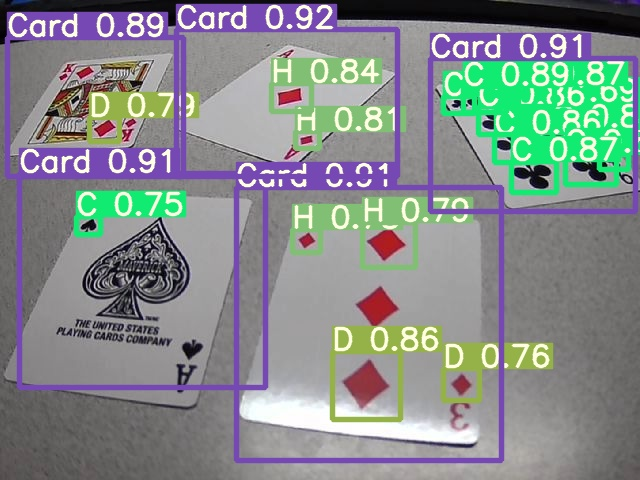

In [39]:
%cd /content/yolov5
!mkdir finalPhoto
%cd /content/yolov5/finalPhoto
finalPhoto=take_photo()
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.6 --source /content/yolov5/finalPhoto --name numCards --exist-ok --save-txt
%cd /content/yolov5/runs/detect/numCards/labels
totalCards=0
with open('photo.txt', 'r') as resultsFile:
  for line in resultsFile:
    if line.split()[0]=='11':
      totalCards+=1

print("Total Cards Currently in View: ", totalCards)
display(Image(filename='/content/yolov5/runs/detect/numCards/photo.jpg'))





### (10 pts) Task 6. Write 300-500 words on the ethical implications of your project.
Make sure you support your thoughts with ethical frameworks from ACM, IEEE, or any other reputible source. 

##Answer to Task 6
                                 
> The first general ethical principle of the ACM code of ethics is that computing professionals should “contribute to society and human well-being.” We believe in our project that advancing the capabilities of computer vision in in general is likely to contribute to a better world. Object detection and recognition can be crucial in many areas. For example, a search and rescue drone would need to be able to visually recognize the humans it is trying to rescue. Better computer vision capabilities would result in better drones that could save more lives, advancing human well-being.

> However, there could potentially be negative implications for both our project and projects like it in the field of computer vision. The second general principle of this code is to “avoid harm.” Our project is able to detect and label playing cards. This capability could potentially be used in a casino to count cards. Since electronic devices which assist with card counting are illegal, this would be an immoral use of this project.

> More broadly, computer vision faces other problematic ethical implications. The fourth general principle here is to “be fair and take action not to discriminate.” Many pieces of facial recognition software have come under fire for overfitting their models to a particular race or ethnicity, causing problems for those of other races or ethnicities when they try to use this software. If we wanted to avoid such a problem we might make sure we used multiple brands of cards to ensure that we didn’t discriminate against any region of the world that uses a specific brand.

> Finally, computer vision projects can also cause harm (against principle #2) if they are used in an unethical manner, such as for certain types of government surveillance. Arguably, the expansive social credit system of China which uses almost one camera for every two citizens to monitor everything they do is one such use. If the government of China or any other government requested to use our software to take part in such an unethical enterprise we would certainly not cooperate.











